# V2에 관한 eda

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import math
from sklearn.preprocessing import StandardScaler, RobustScaler, MaxAbsScaler, QuantileTransformer
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from imblearn.over_sampling import SMOTE
import scipy.stats as stats
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [19]:
df = pd.read_csv("../dataset/dyspepsia_dataset_v2_original.csv")
print(df.shape)
df.head(10)

(100, 376)


,No,Height,Weight,BMI,muscle_mass,body_fat_mass,body_fat_percentage,age,past_medical_history,dyspepsia_startdate,...,W_Area_R_Right,Sys_rate_R_Right,H4/H1_R_Right,Wfb_ratio_R_Right,meanSys_area_R_Right,medSys_area_R_Right,meanPulseArea_R_Right,medPulseArea_R_Right,meanPulseWidth_R_Right,medPulseWidth_R_Right
0,1,157.9,53.4,21.4,20.4,15.6,29.2,50,14,2192,...,214.847,0.45,0.47,2.2849,1246.534,1294.731,1818.141674,1767.252,967.548,1147.687
1,2,154.6,59.3,24.8,19.8,21.9,37.0,60,14,1065,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,164.0,72.7,27.0,23.0,30.4,41.8,50,14,1402,...,603.584,0.45,0.50,1.9694,3091.302,3131.550,4390.967337,4455.811,2248.437,2271.170
3,4,161.1,52.3,20.2,22.1,11.8,22.6,49,14,1949,...,480.577,0.40,0.56,1.7614,2715.069,2592.869,4499.700647,4504.887,1938.826,2098.553
4,5,150.1,46.7,20.7,16.9,14.6,31.3,58,14,1767,...,438.582,0.48,0.52,2.1558,2131.714,2216.248,2887.613241,3028.136,1384.499,1466.942
5,6,167.6,67.3,24.0,27.1,18.0,26.8,51,14,1949,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,159.5,49.4,19.4,19.1,13.2,26.7,58,6,3684,...,114.996,0.32,0.50,4.0013,510.026,461.830,1354.329066,1596.307,352.571,320.504
7,8,152.5,62.2,26.7,21.2,22.9,36.8,53,14,2498,...,651.015,0.44,0.52,1.6465,3031.565,3238.129,4258.831053,4652.240,1859.749,1726.041
8,9,156.7,46.3,18.9,17.9,12.6,27.3,58,8,2223,...,-385.804,0.32,0.62,19.2505,1901.035,1826.291,5540.169444,6572.131,1064.208,1097.796
9,10,159.3,58.4,23.0,21.1,19.4,33.2,49,14,1949,...,387.005,0.50,0.34,1.7619,2372.938,2464.713,3093.280135,3137.107,2048.291,2055.060


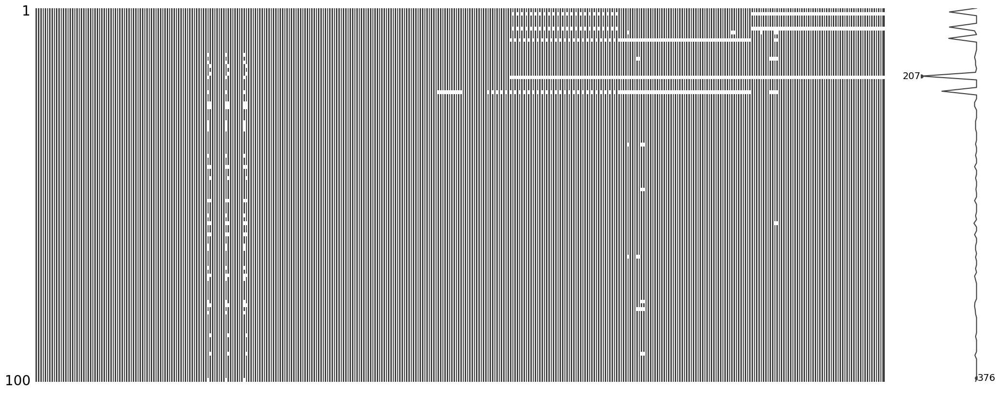

In [20]:
msno.matrix(df)
plt.show()

In [21]:
# 결측치가 있는 컬럼 식별
columns_with_missing = df.columns[df.isnull().any()]

# 결과 출력
print("결측치가 있는 컬럼들:")
print(columns_with_missing.tolist())


결측치가 있는 컬럼들:
['HbO_left_VLPFC', 'HbO_Right_VLPFC', 'HbR_left_VLPFC', 'HbR_Right_VLPFC', 'HbT_left_VLPFC', 'HbT_Right_VLPFC', 'Pulse Rate_left', 'Systolic Blood Pressure_left', 'Diastolic Blood Pressure_left', 'Mean Blood Pressure_left', 'Pulse Pressure_left', 'Stroke Volume_left', 'Cardiac Output_left', 'Systemic Vascular Resistance Index_left', 'Strength_left', 'Depth_left', 'Pulse Rate_left.1', 'ESI_Left', 'ECO(%)_Left', 'ECI_Left', 'ECR_Left', 'RAI_Left', 'Pressure(g)_left', 'Pressure(g)_Right', 'Pressure(mmHg)_left', 'Pressure(mmHg)_Right', 'Energy_left', 'Energy_Right', 'MeanPeriod_left', 'MeanPeriod_Right', 'VarPeriod_left', 'VarPeriod_Right', 'H1_left', 'H1_Right', 'H2_left', 'H2_Right', 'H3_left', 'H3_Right', 'H4_left', 'H4_Right', 'H5_left', 'H5_Right', 'T1_left', 'T1_Right', 'T2_left', 'T2_Right', 'T3_left', 'T3_Right', 'T4_left', 'T4_Right', 'T5_left', 'T5_Right', 'T-T4_left', 'T-T4_Right', 'T_left', 'T_Right', 'W_left', 'W_Right', 'Ap_left', 'Ap_Right', 'As_left', 'As_Right

In [22]:
# 결측치가 있는 행 식별
rows_with_missing = df.isnull().any(axis=1)
num_rows_with_missing = rows_with_missing.sum()

print(f"결측치가 한 개라도 있는 행의 수: {num_rows_with_missing}")

결측치가 한 개라도 있는 행의 수: 38


In [23]:
df.drop(columns=['HbO_left_VLPFC', 'HbO_Right_VLPFC', 'HbR_left_VLPFC', 'HbR_Right_VLPFC', 'HbT_left_VLPFC', 'HbT_Right_VLPFC'], inplace=True)

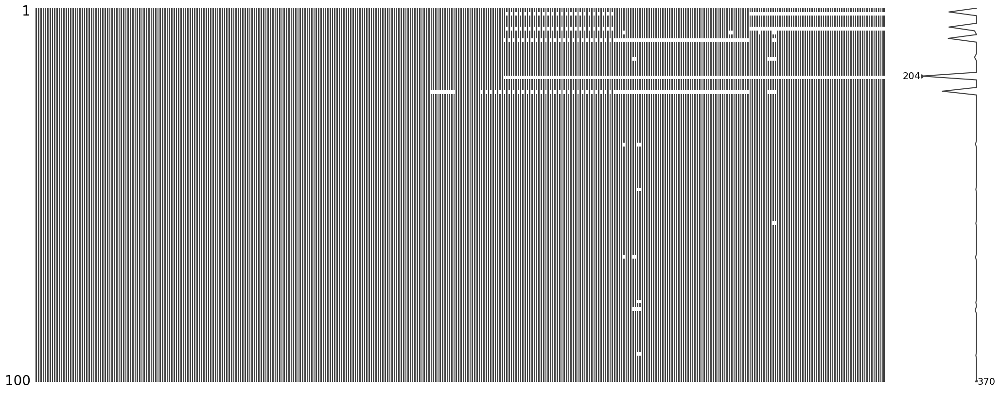

In [24]:
msno.matrix(df)
plt.show()

In [25]:
# 결측치가 있는 컬럼 식별
columns_with_missing = df.columns[df.isnull().any()]

# 결과 출력
print("결측치가 있는 컬럼들:")
print(columns_with_missing.tolist())

결측치가 있는 컬럼들:
['Pulse Rate_left', 'Systolic Blood Pressure_left', 'Diastolic Blood Pressure_left', 'Mean Blood Pressure_left', 'Pulse Pressure_left', 'Stroke Volume_left', 'Cardiac Output_left', 'Systemic Vascular Resistance Index_left', 'Strength_left', 'Depth_left', 'Pulse Rate_left.1', 'ESI_Left', 'ECO(%)_Left', 'ECI_Left', 'ECR_Left', 'RAI_Left', 'Pressure(g)_left', 'Pressure(g)_Right', 'Pressure(mmHg)_left', 'Pressure(mmHg)_Right', 'Energy_left', 'Energy_Right', 'MeanPeriod_left', 'MeanPeriod_Right', 'VarPeriod_left', 'VarPeriod_Right', 'H1_left', 'H1_Right', 'H2_left', 'H2_Right', 'H3_left', 'H3_Right', 'H4_left', 'H4_Right', 'H5_left', 'H5_Right', 'T1_left', 'T1_Right', 'T2_left', 'T2_Right', 'T3_left', 'T3_Right', 'T4_left', 'T4_Right', 'T5_left', 'T5_Right', 'T-T4_left', 'T-T4_Right', 'T_left', 'T_Right', 'W_left', 'W_Right', 'Ap_left', 'Ap_Right', 'As_left', 'As_Right', 'Ad_left', 'Ad_Right', 'Aw_left', 'Aw_Right', 'Angle_left', 'Angle_Right', 'E/min_left', 'E/min_Right', 'Per

In [26]:
# 결측치의 위치(row index, column index)
missing_positions = np.where(df.isnull())

# 행 인덱스와 열 인덱스를 리스트로 변환
missing_rows = missing_positions[0]
missing_cols = missing_positions[1]

# 결과 출력
print("결측치가 있는 셀의 위치:")
for row, col in zip(missing_rows, missing_cols):
    print(f"행 번호: {row + 1}, 컬럼 이름: {df.columns[col]}")


결측치가 있는 셀의 위치:
행 번호: 2, 컬럼 이름: Pressure(g)_Right
행 번호: 2, 컬럼 이름: Pressure(mmHg)_Right
행 번호: 2, 컬럼 이름: Energy_Right
행 번호: 2, 컬럼 이름: MeanPeriod_Right
행 번호: 2, 컬럼 이름: VarPeriod_Right
행 번호: 2, 컬럼 이름: H1_Right
행 번호: 2, 컬럼 이름: H2_Right
행 번호: 2, 컬럼 이름: H3_Right
행 번호: 2, 컬럼 이름: H4_Right
행 번호: 2, 컬럼 이름: H5_Right
행 번호: 2, 컬럼 이름: T1_Right
행 번호: 2, 컬럼 이름: T2_Right
행 번호: 2, 컬럼 이름: T3_Right
행 번호: 2, 컬럼 이름: T4_Right
행 번호: 2, 컬럼 이름: T5_Right
행 번호: 2, 컬럼 이름: T-T4_Right
행 번호: 2, 컬럼 이름: T_Right
행 번호: 2, 컬럼 이름: W_Right
행 번호: 2, 컬럼 이름: Ap_Right
행 번호: 2, 컬럼 이름: As_Right
행 번호: 2, 컬럼 이름: Ad_Right
행 번호: 2, 컬럼 이름: Aw_Right
행 번호: 2, 컬럼 이름: Angle_Right
행 번호: 2, 컬럼 이름: E/min_Right
행 번호: 2, 컬럼 이름: Std_period_Right
행 번호: 2, 컬럼 이름: Std_Main_Right
행 번호: 2, 컬럼 이름: Var_period_Right
행 번호: 2, 컬럼 이름: Var_MainPeak_Right
행 번호: 2, 컬럼 이름: Gradient_I1_Right
행 번호: 2, 컬럼 이름: Gradient_I2_Right
행 번호: 2, 컬럼 이름: Gradient_D1_Right
행 번호: 2, 컬럼 이름: Gradient_D2_Right
행 번호: 2, 컬럼 이름: MeanResp_Right
행 번호: 2, 컬럼 이름: stdRespi_Right
행 번호: 2, 

In [27]:
# 제거할 인덱스 리스트
indices_to_remove = [1,5,8,18,22]

# 행 제거 (새로운 DataFrame 반환)
df = df.drop(indices_to_remove)


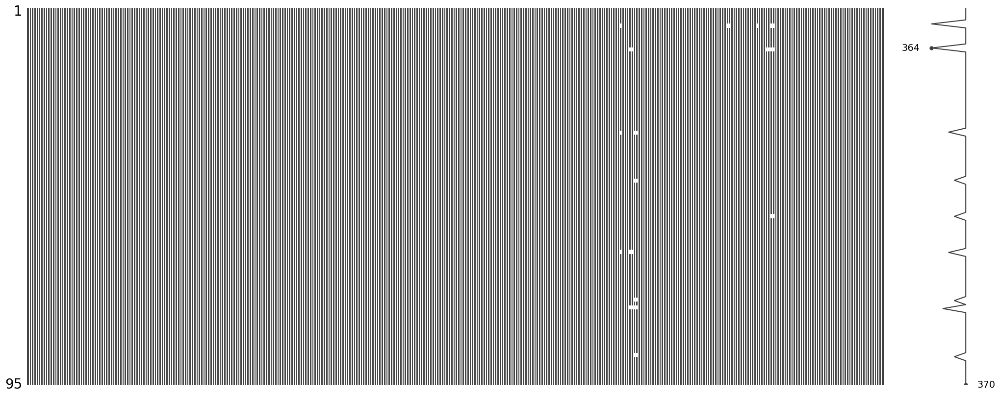

In [28]:
msno.matrix(df)
plt.show()

In [29]:
df.shape

(95, 370)

In [30]:
from sklearn.impute import KNNImputer
knn = KNNImputer(n_neighbors=2, weights="uniform")
df = pd.DataFrame(knn.fit_transform(df), columns=df.columns)

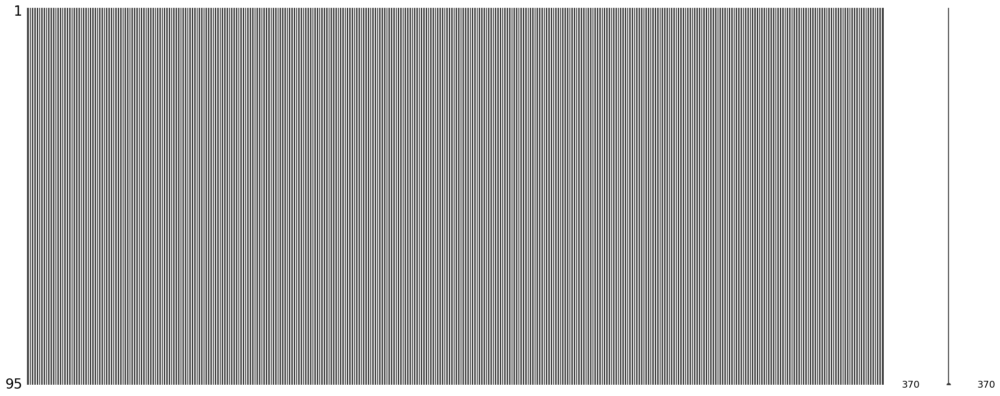

In [31]:
msno.matrix(df)
plt.show()

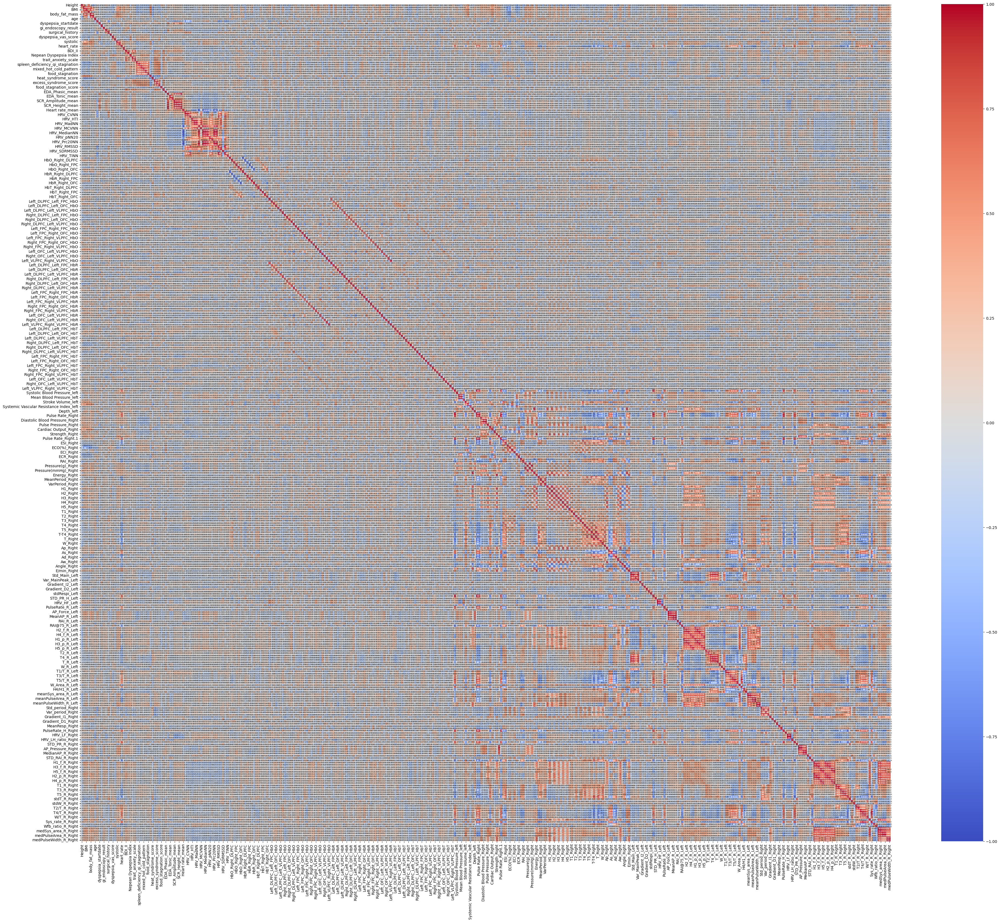

In [32]:
target_1 = df['diagnosis']
target_2 = df['diagnosis_type']
df.drop(columns=['No', 'diagnosis', 'diagnosis_type'], inplace=True)

corr = df.corr()
plt.figure(figsize=(48, 40))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 5}, vmin=-1, vmax=1)
plt.show()

In [33]:
t = 0.5

pairs = []
pair_set = set()
for i in range(len(corr.columns)):
    for j in range(i+1, len(corr.columns)):
        if abs(corr.iloc[i, j]) > t:
            col1 = corr.columns[i]
            col2 = corr.columns[j]
            c = corr.iloc[i, j]
            if((col1, col2) not in pair_set): #(col1, col2), (col2, col1) 두번 들어오는 걸 방지
                pairs.append((col1, col2, c))
                pair_set.add((col1, col2))
pairs.sort()
pairs.sort(key=lambda x: x[2], reverse=True)
pairs

[('Pulse Rate_Right', 'Pulse Rate_Right.1', 1.0),
 ('Pulse Rate_left', 'Pulse Rate_left.1', 1.0),
 ('Strength_left', 'Energy_left', 1.0),
 ('T4/T_R_Right', 'Sys_rate_R_Right', 1.0),
 ('Pressure(g)_left', 'Pressure(mmHg)_left', 0.9999999999999998),
 ('Pressure(g)_Right', 'Pressure(mmHg)_Right', 0.9999999999999994),
 ('AP_Force_Left', 'AP_Pressure_Left', 0.9999999958818175),
 ('AP_Force_Right', 'AP_Pressure_Right', 0.9999999944534851),
 ('H2_f_R_Right', 'H2_p_R_Right', 0.9999999342251276),
 ('H2_f_R_Left', 'H2_p_R_Left', 0.9999999332797302),
 ('H1_f_R_Right', 'H1_p_R_Right', 0.9999999323440936),
 ('H3_f_R_Left', 'H3_p_R_Left', 0.9999999244715627),
 ('H3_f_R_Right', 'H3_p_R_Right', 0.9999999147276138),
 ('H1_f_R_Left', 'H1_p_R_Left', 0.9999999125073993),
 ('H5_f_R_Left', 'H5_p_R_Left', 0.9999998114945047),
 ('H4_f_R_Left', 'H4_p_R_Left', 0.9999997919437466),
 ('H4_f_R_Right', 'H4_p_R_Right', 0.9999997780356699),
 ('H5_f_R_Right', 'H5_p_R_Right', 0.9999997401870927),
 ('HRV_RMSSD', 'HRV_SD